In [1]:
import os

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [3]:
from scipy.signal import convolve2d as conv2d

# laser process

In [46]:
file_path = '../files/'
fn_list = os.listdir(file_path)
img_list = [file_path + x for x in fn_list if x.split('.')[-1]=='jpg']

In [33]:
def find_center(img, ks = 9):
    assert ks % 3 == 0
    cl = ks / 2 + 1
    p = (ks - cl) / 2
    h0 = np.ones((ks, ks))
    h0[:, 0:p] = -1
    h0[:, -p:] = -1
    h2 = h0.transpose()

    cl = ks / 2
    xx, yy = np.meshgrid(np.arange(ks), np.arange(ks))
    h1 = np.ones((ks, ks)) * -1
    h1[(xx - yy < cl) & ( yy - xx < cl)] = 1
    h3 = np.fliplr(h1)

    k0 = np.sum(h0)
    k1 = np.sum(h1)
    k2 = np.sum(h2)
    k3 = np.sum(h3)

    h0 = h0 / k0
    h2 = h2 / k2
    h1 = h1 / k1
    h3 = h3 / k3

    h, s, v = cv2.split(cv2.cvtColor(img, cv2.COLOR_BGR2HSV))
    x = v

    c0 = conv2d(x, h0, 'same', boundary='symm')
    c1 = conv2d(x, h1, 'same', boundary='symm')
    c2 = conv2d(x, h2, 'same', boundary='symm')
    c3 = conv2d(x, h3, 'same', boundary='symm')

    data = np.stack([c0, c1, c2, c3], axis=-1)

    data_out = np.max(data, axis=-1)
    
    max_index = np.argmax(data_out, axis=0)
    x = np.arange(data_out.shape[1])
    y = max_index
    outd = data_out[y, x]
    outh = h[y, x]
    choice = (outh > 150) & (outh < 180) & (outd > 250)
    nx, ny = x[choice], y[choice]
    
    plt.plot(outd, label='d')
    plt.plot(outh, label='h')
    plt.legend()
    
    return nx, ny

In [31]:
%timeit nx, ny = find_center(img, 9)

1 loop, best of 3: 180 ms per loop


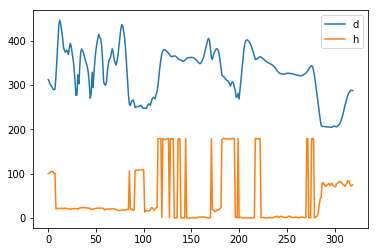

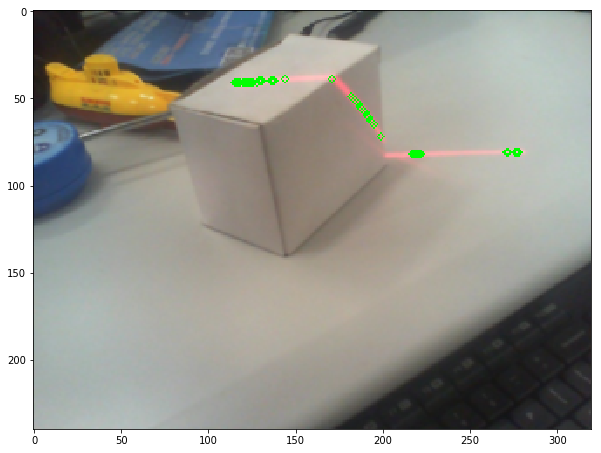

In [34]:
img = cv2.imread(img_list[0])
img = cv2.pyrDown(img)

nx, ny = find_center(img, 9)
plt.figure(figsize=[10, 10])
img_show = img.copy()
for x, y in zip(nx, ny):
    cv2.circle(img_show, (x, y), 2, (0, 255, 0))
plt.imshow(img_show[:, :, ::-1])
plt.show()

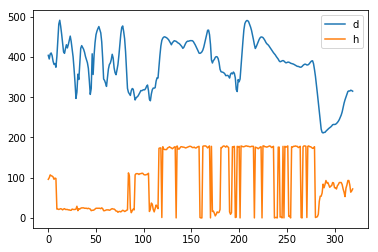

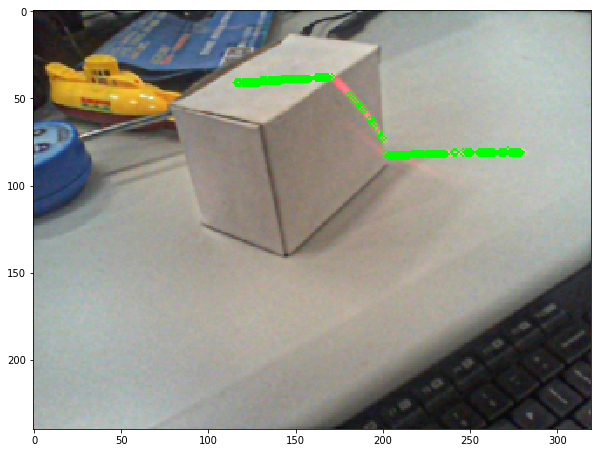

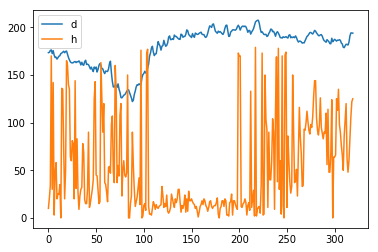

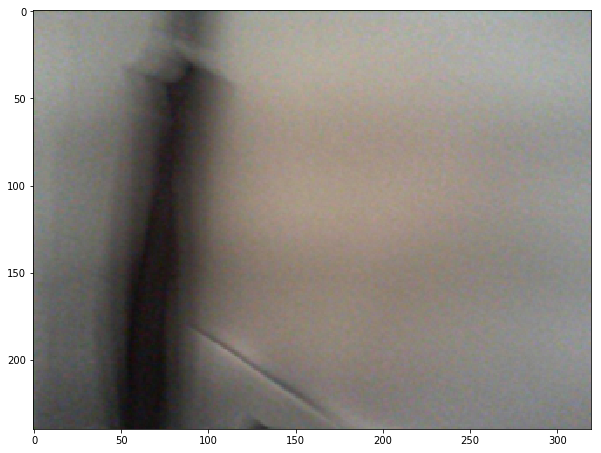

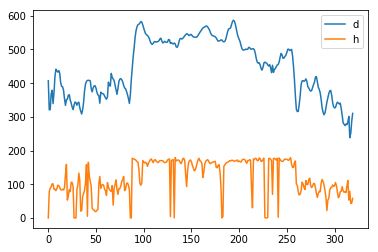

...

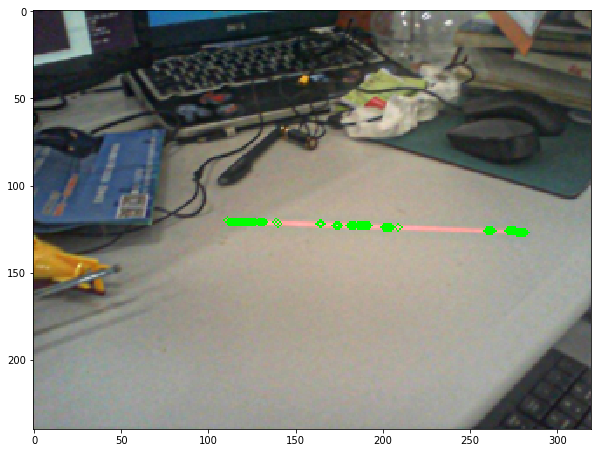

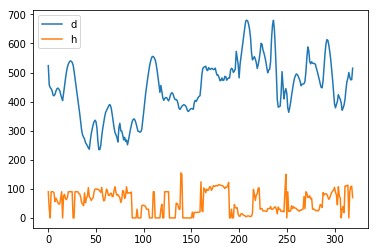

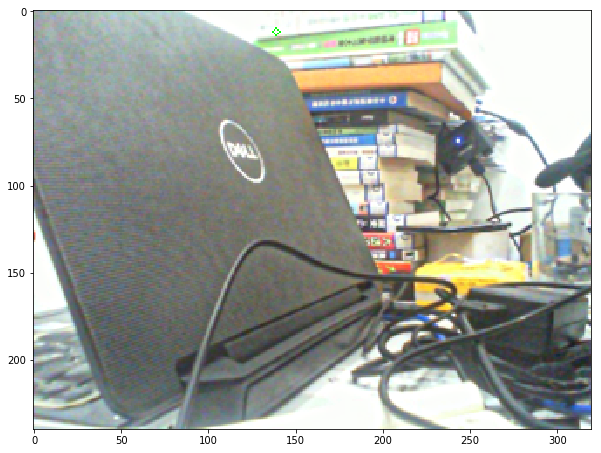

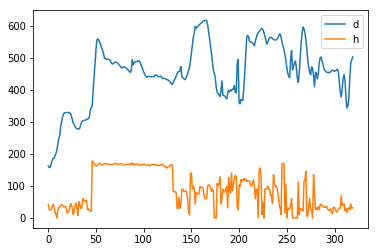

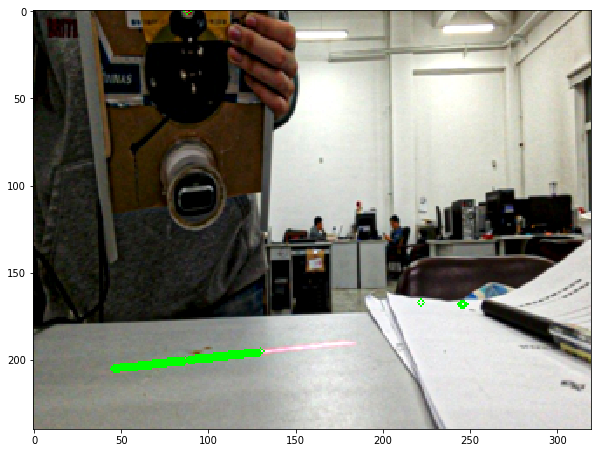

In [90]:
for nm in img_list:
    img = cv2.imread(nm)
    img = cv2.pyrDown(img)
    
    img = img.astype(np.float32) / 255
    out = cv2.ximgproc.guidedFilter(img, img, 3, 0.01)
    img = (img - out) * 3 + out
    img = img * 255
    img[img > 255] = 255
    img[img < 0] = 0
    img = img.astype(np.uint8)
    

    
    nx, ny = find_center(img, 9)
    
    plt.figure(figsize=[10, 10])
    img_show = img.copy()
    for x, y in zip(nx, ny):
        cv2.circle(img_show, (x, y), 2, (0, 255, 0))
    plt.imshow(img_show[:, :, ::-1])
    plt.show()

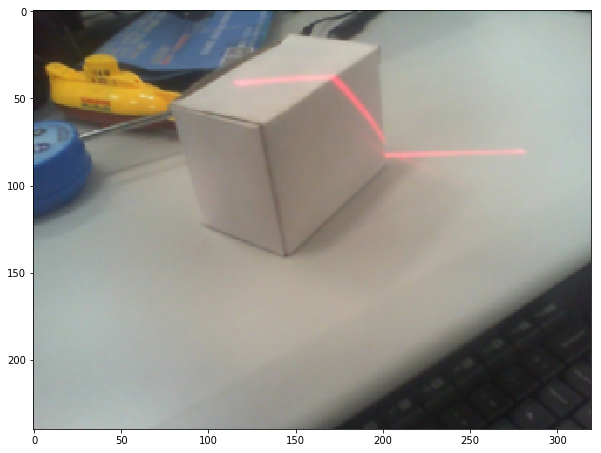

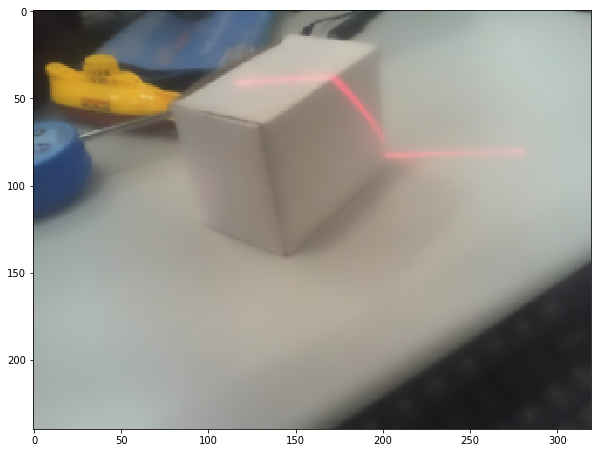

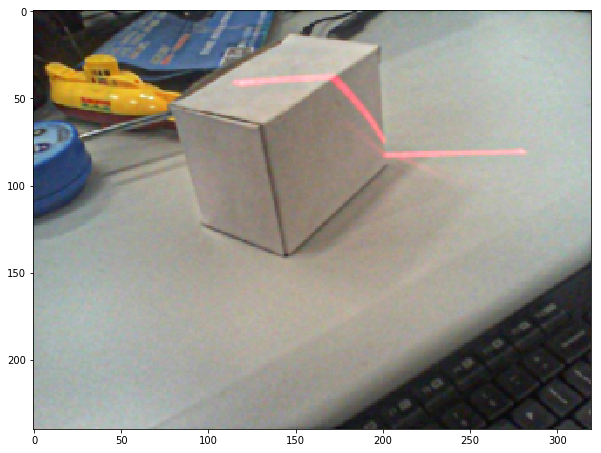

In [89]:
img = cv2.imread(img_list[0])
img = cv2.pyrDown(img)
img = img.astype(np.float32) / 255
out = cv2.ximgproc.guidedFilter(img, img, 3, 0.01)

plt.figure(figsize=[10, 10])
plt.imshow(img[:, :, ::-1])

plt.figure(figsize=[10, 10])
plt.imshow(out[:, :, ::-1])

out = (img - out) * 3 + out
out *= 255
out[out > 255] = 255
out[out < 0] = 0
out = out.astype(np.uint8)

plt.figure(figsize=[10, 10])
plt.imshow(out[:, :, ::-1])

In [37]:
help(cv2.ximgproc.guidedFilter)

Help on built-in function guidedFilter:

guidedFilter(...)
    guidedFilter(guide, src, radius, eps[, dst[, dDepth]]) -> dst
    .   @brief Simple one-line Guided Filter call.
    .   
    .   If you have multiple images to filter with the same guided image then use GuidedFilter interface to
    .   avoid extra computations on initialization stage.
    .   
    .   @param guide guided image (or array of images) with up to 3 channels, if it have more then 3
    .   channels then only first 3 channels will be used.
    .   
    .   @param src filtering image with any numbers of channels.
    .   
    .   @param dst output image.
    .   
    .   @param radius radius of Guided Filter.
    .   
    .   @param eps regularization term of Guided Filter. \f${eps}^2\f$ is similar to the sigma in the color
    .   space into bilateralFilter.
    .   
    .   @param dDepth optional depth of the output image.
    .   
    .   @sa bilateralFilter, dtFilter, amFilter



In [12]:
np.stack([nx, ny], axis=1).shape

(158, 2)

In [23]:
p = np.array([1, 2])

In [25]:
if p is not None:
    print(11)

11


In [21]:
np.stack([a, b], axis=1)
if :
    print(True)

SyntaxError: invalid syntax (<ipython-input-21-5af025c4d094>, line 2)

In [15]:
np.ones_like(nx)*False

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [17]:
a =  nx[np.ones_like(nx)<0]
b = a.copy()

In [5]:
len(img_list)

13

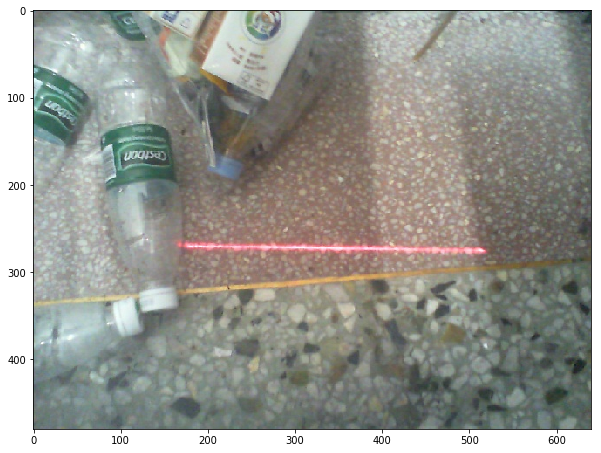

In [6]:
img = cv2.imread(img_list[6])
plt.figure(figsize=[10, 10])
plt.imshow(img[:, :, ::-1])
plt.show()

In [7]:
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

In [8]:
b, g, r = cv2.split(img)

In [9]:
h, s, v = cv2.split(hsv)

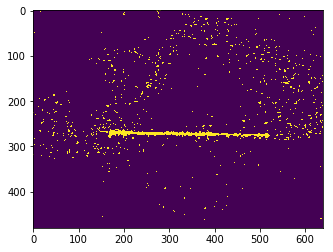

In [83]:
plt.imshow(h > 150)

(array([ 71664.,  55051.,  31816.,  36533.,  61220.,  34207.,   6639.,
          1942.,   1000.,   7128.]),
 array([   0. ,   17.9,   35.8,   53.7,   71.6,   89.5,  107.4,  125.3,
         143.2,  161.1,  179. ]),
 <a list of 10 Patch objects>)

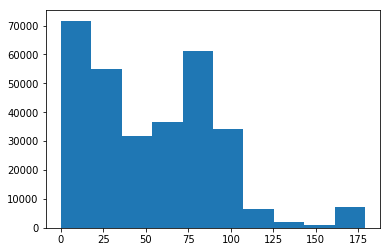

In [82]:
plt.hist(h.reshape(-1))

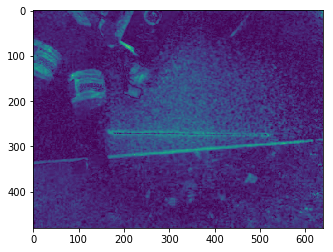

In [80]:
plt.imshow(s)

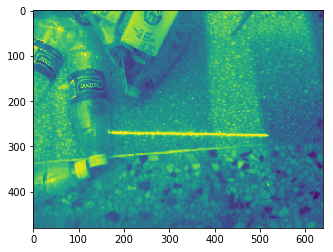

In [81]:
plt.imshow(v)

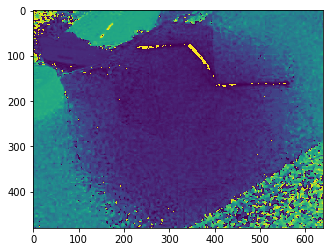

In [18]:
plt.imshow(h)

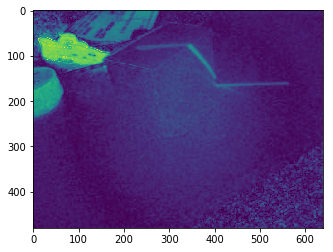

In [16]:
plt.imshow(s)

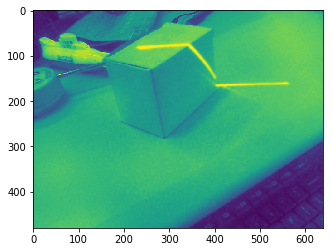

In [143]:
plt.imshow(v)

In [75]:
ks = 9
assert ks % 3 == 0
cl = ks / 2 + 1
p = (ks - cl) / 2
h0 = np.ones((ks, ks))
h0[:, 0:p] = -1
h0[:, -p:] = -1
h2 = h0.transpose()

cl = ks / 2
xx, yy = np.meshgrid(np.arange(ks), np.arange(ks))
h1 = np.ones((ks, ks)) * -1
h1[(xx - yy < cl) & ( yy - xx < cl)] = 1
h3 = np.fliplr(h1)

k0 = np.sum(h0)
k1 = np.sum(h1)
k2 = np.sum(h2)
k3 = np.sum(h3)

h0 = h0 / k0
h2 = h2 / k2
h1 = h1 / k1
h3 = h3 / k3

x = v

c0 = conv2d(x, h0, 'same', boundary='symm')
c1 = conv2d(x, h1, 'same', boundary='symm')
c2 = conv2d(x, h2, 'same', boundary='symm')
c3 = conv2d(x, h3, 'same', boundary='symm')

data = np.stack([c0, c1, c2, c3], axis=-1)

data_out = np.max(data, axis=-1)

In [76]:
data_out.shape

(480, 640)

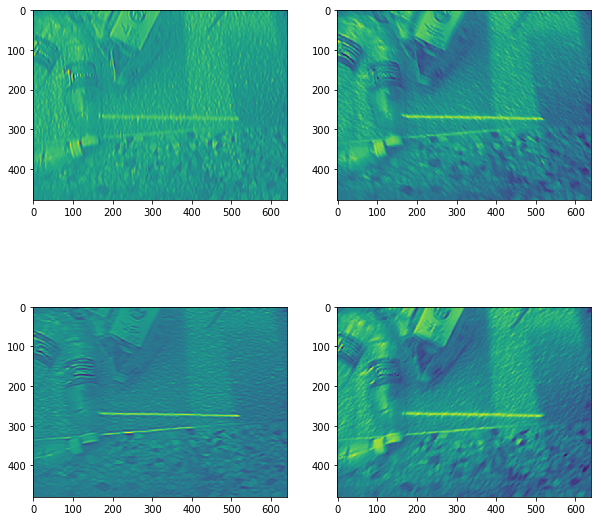

In [77]:
plt.figure(figsize=[10, 10])
plt.subplot(221)
plt.imshow(c0)
plt.subplot(222)
plt.imshow(c1)
plt.subplot(223)
plt.imshow(c2)
plt.subplot(224)
plt.imshow(c3)

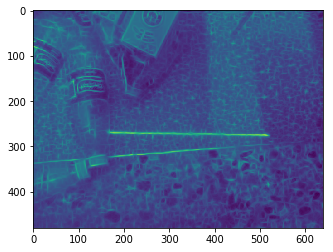

In [78]:
plt.imshow(data_out)

In [123]:
max_index = np.argmax(data_out, axis=0)
x = np.arange(data_out.shape[1])
y = max_index
outd = data_out[y, x]
outh = h[y, x]
choice = (outh > 150) & (outh < 180) & (outd > 375)
nx, ny = x[choice], y[choice]

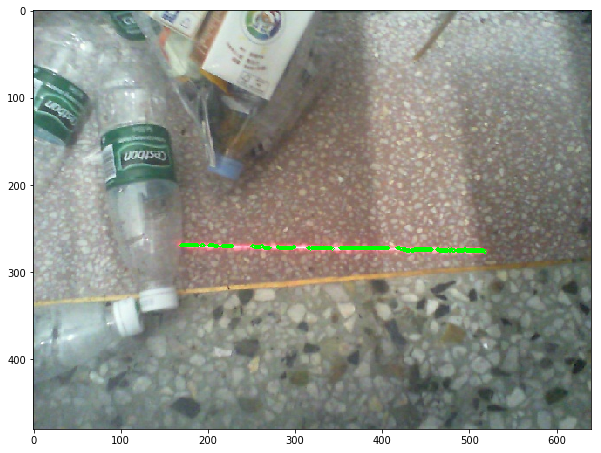

In [134]:
plt.figure(figsize=[10, 10])
img_show = img.copy()
for x, y in zip(nx, ny):
    cv2.circle(img_show, (x, y), 2, (0, 255, 0))
plt.imshow(img_show[:, :, ::-1])

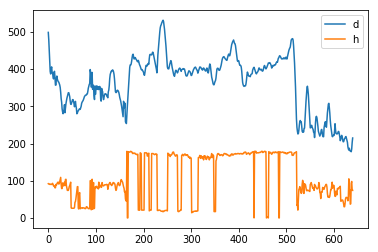

In [121]:
plt.plot(outd, label='d')
plt.plot(outh, label='h')
plt.legend()

In [114]:
out.shape

(640,)

In [105]:
x.shape

(640,)

In [106]:
y.shape

(640,)

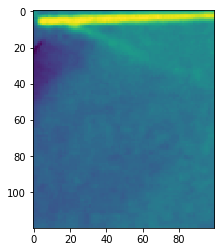

In [104]:
plt.imshow(v[100+60:200+80, 400:500])

(array([  23254.,   17779.,   12413.,   10515.,   13511.,   50525.,
         128482.,   44632.,    4199.,    1890.]),
 array([  15.,   39.,   63.,   87.,  111.,  135.,  159.,  183.,  207.,
         231.,  255.]),
 <a list of 10 Patch objects>)

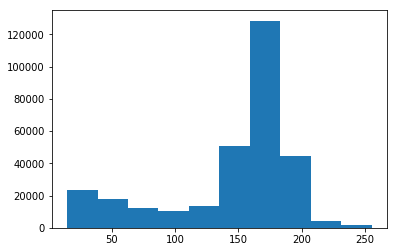

In [64]:
plt.hist(r.reshape(-1))

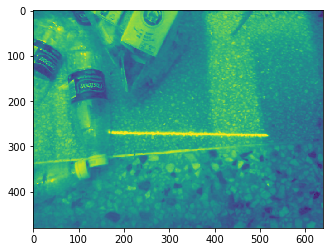

In [93]:
plt.imshow(r)

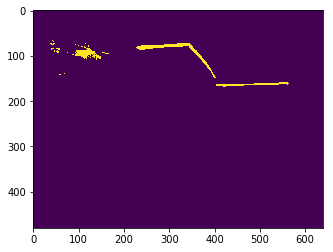

In [75]:
plt.imshow(r>220)

In [51]:
ks = (14, 14)
value = v.astype(np.float32) / 255.
mean = cv2.blur(value, ks)
var = cv2.blur((value - mean)**2, ks)

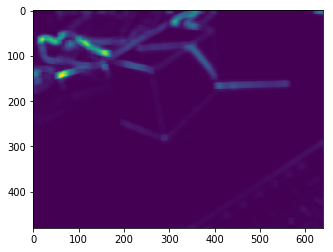

In [52]:
plt.imshow(var)

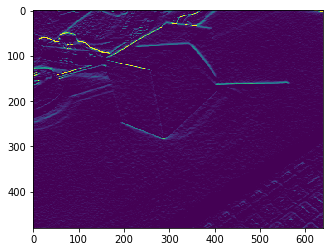

In [36]:
plt.imshow(cv2.Sobel(v, -1, 0, 1))

In [32]:
help(cv2.Sobel)

Help on built-in function Sobel:

Sobel(...)
    Sobel(src, ddepth, dx, dy[, dst[, ksize[, scale[, delta[, borderType]]]]]) -> dst
    .   @brief Calculates the first, second, third, or mixed image derivatives using an extended Sobel operator.
    .   
    .   In all cases except one, the \f$\texttt{ksize} \times \texttt{ksize}\f$ separable kernel is used to
    .   calculate the derivative. When \f$\texttt{ksize = 1}\f$, the \f$3 \times 1\f$ or \f$1 \times 3\f$
    .   kernel is used (that is, no Gaussian smoothing is done). `ksize = 1` can only be used for the first
    .   or the second x- or y- derivatives.
    .   
    .   There is also the special value `ksize = CV_SCHARR (-1)` that corresponds to the \f$3\times3\f$ Scharr
    .   filter that may give more accurate results than the \f$3\times3\f$ Sobel. The Scharr aperture is
    .   
    .   \f[\vecthreethree{-3}{0}{3}{-10}{0}{10}{-3}{0}{3}\f]
    .   
    .   for the x-derivative, or transposed for the y-derivative.
    .   
  

In [28]:
help(cv2.Canny)

Help on built-in function Canny:

Canny(...)
    Canny(image, threshold1, threshold2[, edges[, apertureSize[, L2gradient]]]) -> edges
    .   @brief Finds edges in an image using the Canny algorithm @cite Canny86 .
    .   
    .   The function finds edges in the input image and marks them in the output map edges using the
    .   Canny algorithm. The smallest value between threshold1 and threshold2 is used for edge linking. The
    .   largest value is used to find initial segments of strong edges. See
    .   <http://en.wikipedia.org/wiki/Canny_edge_detector>
    .   
    .   @param image 8-bit input image.
    .   @param edges output edge map; single channels 8-bit image, which has the same size as image .
    .   @param threshold1 first threshold for the hysteresis procedure.
    .   @param threshold2 second threshold for the hysteresis procedure.
    .   @param apertureSize aperture size for the Sobel operator.
    .   @param L2gradient a flag, indicating whether a more accurate \

In [309]:
detector = Extract_center_line_by_direction_template(11, 5, is_cuda=True)

In [310]:
for idx in range(len(img_list)):
    img = cv2.imread(img_list[idx])
    out = detector(img)
    test = out.cpu().numpy()
    plt.imshow((test).astype(np.uint8), 'gray')
    plt.show()

RuntimeError: cuda runtime error (48) : no kernel image is available for execution on the device at c:\users\administrator\downloads\new-builder\win-wheel\pytorch\aten\src\thc\generated\../THCTensorMathReduce.cuh:589

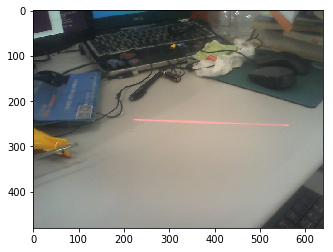

In [86]:
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

In [60]:
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

In [61]:
h, s, v = cv2.split(hsv)

In [95]:
b, g, r = cv2.split(img)

(array([19373., 47715., 33500., 19641., 17602., 42253., 99952., 25141.,
         1078.,   945.]),
 array([ 10. ,  34.5,  59. ,  83.5, 108. , 132.5, 157. , 181.5, 206. ,
        230.5, 255. ]),
 <a list of 10 Patch objects>)

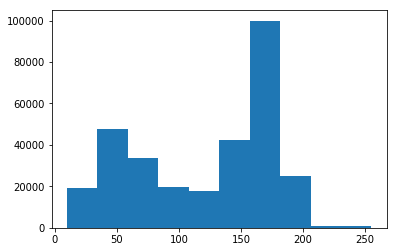

In [96]:
plt.hist(r.reshape(1, -1).squeeze())

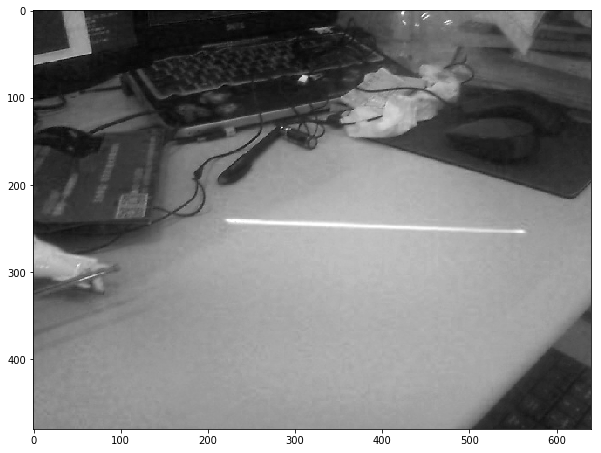

In [98]:
plt.figure(figsize=[10, 10])
plt.imshow(r, 'gray')

(array([ 53098., 122455.,  32180.,  16333.,  27491.,  31926.,  16425.,
          4530.,    829.,   1933.]),
 array([  0. ,  17.9,  35.8,  53.7,  71.6,  89.5, 107.4, 125.3, 143.2,
        161.1, 179. ]),
 <a list of 10 Patch objects>)

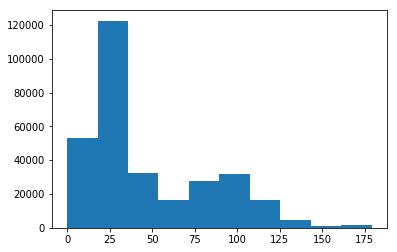

In [94]:
plt.hist(h.reshape(1, -1).squeeze())

In [91]:
s

array([[94, 91, 80, ..., 57, 63, 61],
       [87, 79, 80, ..., 55, 56, 58],
       [87, 79, 77, ..., 44, 48, 49],
       ...,
       [ 5,  9,  9, ..., 26, 16, 16],
       [ 9, 11, 11, ..., 16, 11, 16],
       [ 9, 11, 11, ..., 15, 16, 27]], dtype=uint8)

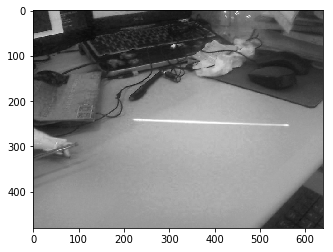

In [92]:
plt.imshow(v, 'gray')

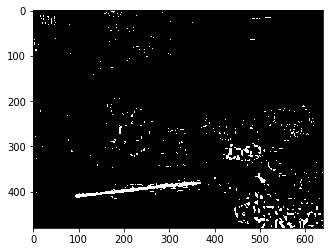

In [15]:
plt.imshow(threshold_by_range(h, 150, 180), 'gray')

(array([171201.,  44108.,  23205.,  11862.,   7453.,   6020.,   5606.,
          5482.,   8233.,  24030.]),
 array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
        229.5, 255. ]),
 <a list of 10 Patch objects>)

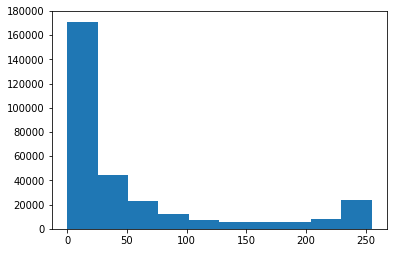

In [13]:
plt.hist(s.reshape(1, -1).squeeze())

(array([43912., 48252., 21898., 11782., 12271., 28887., 18421., 24270.,
        62889., 34618.]),
 array([  0. ,  25.5,  51. ,  76.5, 102. , 127.5, 153. , 178.5, 204. ,
        229.5, 255. ]),
 <a list of 10 Patch objects>)

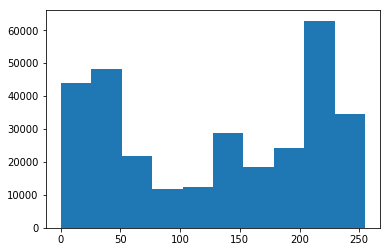

In [14]:
plt.hist(v.reshape(1, -1).squeeze())

In [109]:
center_size = 3
kernel_size = 5

h = np.arange(0, kernel_size)
w = np.arange(0, kernel_size)
hh, ww = np.meshgrid(h, w)


In [21]:
from scipy import signal

ImportError: No module named scipy

In [ ]:
import torch
from torch import nn

class Extract_center_line_by_direction_template_numpy:
    def __init__(self, kernel_size, center_size):
        assert isinstance(kernel_size, int)
        assert isinstance(center_size, int)
        assert kernel_size >= (center_size+2)
        assert (kernel_size % 2 == 1)
        assert (center_size % 2 == 1)

        self.ks = kernel_size
        self.cs = center_size
        
        self.init_kernal()
    
    def __call__(self, img):
        img_pre = self.preprocessing(img).reshape(1, 1, img.shape[0], img.shape[1])
        tensor_in = torch.from_numpy(img_pre).reshape(1, 1, img.shape[0], img.shape[1]).type(torch.float)
        if self.is_cuda:
            tensor_in = tensor_in.cuda()
        
        out = nn.functional.conv2d(tensor_in, self.kernel, padding=((self.ks-1)/2, (self.ks-1)/2))
        out = out.squeeze(0)
        maxval, _ = torch.max(out, dim=0, keepdim=False)
        return maxval
        
    
    def init_kernal(self):
        k1 = torch.zeros(self.ks, self.ks, dtype=torch.float, requires_grad=self.requires_grad)
        k2 = torch.zeros(self.ks, self.ks, dtype=torch.float, requires_grad=self.requires_grad)
        
        # k1, k2
        index = int((self.ks-self.cs)/2)        
        k1[:, index:-index] = 1
        k2[index:-index, :] = 1
        
        # k3, k4
        half_center_size = (self.cs-1)/2
        h = np.arange(0, self.ks)
        w = np.arange(0, self.ks)
        ww, hh = np.meshgrid(h, w)
        
        k3_np = np.zeros((self.ks, self.ks), dtype=np.float32)
        k4_np = np.zeros((self.ks, self.ks), dtype=np.float32)
        
        index = ((ww-hh)<=half_center_size)&((ww-hh)>=-half_center_size)
        k3_np[index] = 1
        index = ((ww+hh)<=(self.ks+half_center_size-1))&((ww+hh)>=(self.ks-half_center_size-1))
        k4_np[index] = 1
        
        k3 = torch.from_numpy(k3_np)
        k4 = torch.from_numpy(k4_np)
                
        self.kernel = [k1, k2, k3, k4]
        self.kernel = [(k*torch.sum(k)/(self.ks*self.ks)).reshape(1, 1, self.ks, self.ks) for k in self.kernel]
        self.kernel = torch.cat(self.kernel, dim=0)/(self.ks*self.ks)
        if self.is_cuda:
            self.kernel = self.kernel.cuda()
    
    def preprocessing(self, img):
        b, g, r = cv2.split(img)
        return r

In [21]:
import torch
from torch import nn

class Extract_center_line_by_direction_template:
    def __init__(self, kernel_size, center_size, is_cuda=False, requires_grad=False):
        assert isinstance(kernel_size, int)
        assert isinstance(center_size, int)
        assert kernel_size >= (center_size+2)
        assert (kernel_size % 2 == 1)
        assert (center_size % 2 == 1)

        self.ks = kernel_size
        self.cs = center_size
        self.requires_grad = requires_grad
        self.is_cuda = is_cuda
        
        self.init_kernal()
    
    def __call__(self, img):
        img_pre = self.preprocessing(img).reshape(1, 1, img.shape[0], img.shape[1])
        tensor_in = torch.from_numpy(img_pre).reshape(1, 1, img.shape[0], img.shape[1]).type(torch.float)
        if self.is_cuda:
            tensor_in = tensor_in.cuda()
        
        out = nn.functional.conv2d(tensor_in, self.kernel, padding=((self.ks-1)/2, (self.ks-1)/2))
        out = out.squeeze(0)
        maxval, _ = torch.max(out, dim=0, keepdim=False)
        return maxval
        
    
    def init_kernal(self):
        k1 = torch.zeros(self.ks, self.ks, dtype=torch.float, requires_grad=self.requires_grad)
        k2 = torch.zeros(self.ks, self.ks, dtype=torch.float, requires_grad=self.requires_grad)
        
        # k1, k2
        index = int((self.ks-self.cs)/2)        
        k1[:, index:-index] = 1
        k2[index:-index, :] = 1
        
        # k3, k4
        half_center_size = (self.cs-1)/2
        h = np.arange(0, self.ks)
        w = np.arange(0, self.ks)
        ww, hh = np.meshgrid(h, w)
        
        k3_np = np.zeros((self.ks, self.ks), dtype=np.float32)
        k4_np = np.zeros((self.ks, self.ks), dtype=np.float32)
        
        index = ((ww-hh)<=half_center_size)&((ww-hh)>=-half_center_size)
        k3_np[index] = 1
        index = ((ww+hh)<=(self.ks+half_center_size-1))&((ww+hh)>=(self.ks-half_center_size-1))
        k4_np[index] = 1
        
        k3 = torch.from_numpy(k3_np)
        k4 = torch.from_numpy(k4_np)
                
        self.kernel = [k1, k2, k3, k4]
        self.kernel = [(k*torch.sum(k)/(self.ks*self.ks)).reshape(1, 1, self.ks, self.ks) for k in self.kernel]
        self.kernel = torch.cat(self.kernel, dim=0)/(self.ks*self.ks)
        if self.is_cuda:
            self.kernel = self.kernel.cuda()
    
    def preprocessing(self, img):
        b, g, r = cv2.split(img)
        return r

ImportError: No module named torch

In [191]:
t = nn.Conv2d(in_channels=1, out_channels=1, kernel_size=3)

In [ ]:
conv2d()

In [219]:
h, w = r.shape

In [220]:
h, w

(480, 640)

In [227]:
detector.kernel.shape

torch.Size([4, 1, 11, 11])

In [239]:
img_pre = r
ks = 11
out = nn.functional.conv2d(torch.from_numpy(img_pre).reshape(1, 1, h, w).type(torch.float), detector.kernel, padding=(5, 5))

In [240]:
out.shape

torch.Size([1, 4, 480, 640])

In [241]:
(kernel_size-1)/2, (kernel_size-1)/2

(2.0, 2.0)

In [196]:
help(nn.functional.conv2d)

Help on built-in function conv2d:

conv2d(...)
    conv2d(input, weight, bias=None, stride=1, padding=0, dilation=1, groups=1) -> Tensor
    
    Applies a 2D convolution over an input image composed of several input
    planes.
    
    See :class:`~torch.nn.Conv2d` for details and output shape.
    
    Args:
        input: input tensor of shape (:math:`minibatch \times in\_channels \times iH \times iW`)
        weight: filters of shape (:math:`out\_channels \times \frac{in\_channels}{groups} \times kH \times kW`)
        bias: optional bias tensor of shape (:math:`out\_channels`). Default: ``None``
        stride: the stride of the convolving kernel. Can be a single number or a
          tuple `(sH, sW)`. Default: 1
        padding: implicit zero paddings on both sides of the input. Can be a
          single number or a tuple `(padH, padW)`. Default: 0
        dilation: the spacing between kernel elements. Can be a single number or
          a tuple `(dH, dW)`. Default: 1
        gr

In [279]:
detector = Extract_center_line_by_direction_template(11, 5)

In [292]:
out = detector(img)

out.shape

test = out.cpu().numpy()

plt.imshow((test).astype(np.uint8), 'gray')

In [272]:
out.max()

tensor(50.6236)

In [273]:
out.min()

tensor(2.3967)

In [257]:
out.shape

torch.Size([1, 480, 640])

In [258]:
out.max()

tensor(6125.4570)

In [259]:
out.min()

tensor(290.0000)

In [212]:
detector.kernel.shape

torch.Size([4, 1, 11, 11])

In [182]:
torch.sum(detector.k4)

tensor(49.)

In [103]:
torch.Tensor([[1, 2]]).shape

torch.Size([1, 2])

# plane process

In [8]:
file_list = ['image.png', 'image2.png', 'image5.png']
fp = '../files/'
img_fp = fp + file_list[0]
img = cv2.imread(img_fp)

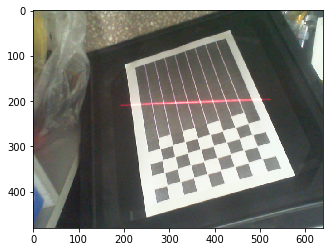

In [11]:
plt.imshow(img[:, :, ::-1])

In [75]:
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# findit, corners = cv2.findChessboardCorners(gray, (7, 3), None)#, cv2.CALIB_CB_ADAPTIVE_THRESH)
# print('find it' if findit else 'not find it')
findit, corners = cv2.findChessboardCorners(gray, (8, 3), None, 
                                            cv2.CALIB_CB_ADAPTIVE_THRESH + cv2.CALIB_CB_NORMALIZE_IMAGE + cv2.CALIB_CB_FAST_CHECK)
print('find it' if findit else 'not find it')

if findit:
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.1)    
    cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
    
out = cv2.drawChessboardCorners(img, (8, 3), corners, findit)

In [81]:
corners.shape

(24, 1, 2)

In [82]:
corners[0, 0, :]

array([ 505.74887085,  327.85006714], dtype=float32)

In [83]:
help(cv2.circle)

Help on built-in function circle:

circle(...)
    circle(img, center, radius, color[, thickness[, lineType[, shift]]]) -> img
    .   @brief Draws a circle.
    .   
    .   The function circle draws a simple or filled circle with a given center and radius.
    .   @param img Image where the circle is drawn.
    .   @param center Center of the circle.
    .   @param radius Radius of the circle.
    .   @param color Circle color.
    .   @param thickness Thickness of the circle outline, if positive. Negative thickness means that a
    .   filled circle is to be drawn.
    .   @param lineType Type of the circle boundary. See the line description.
    .   @param shift Number of fractional bits in the coordinates of the center and in the radius value.



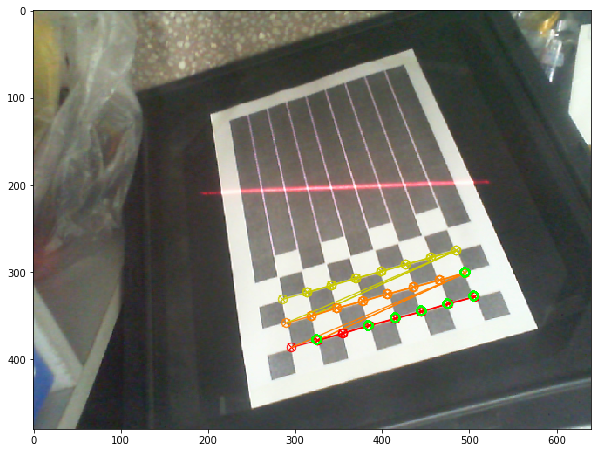

In [91]:
cv2.circle(out, tuple(corners[8, 0, :].astype(np.int32)), 5, (0, 255, 0), 2)
plt.figure(figsize=[10, 10])
plt.imshow(out[:, :, ::-1])

In [36]:
if findit:
#     corners = corners.squeeze()
    cornerSubPix(gray, corners, Size(11, 11), Size(-1, -1))
    



In [37]:
print(corners.shape)

(21, 2)


In [38]:
help(cv2.findChessboardCorners)

Help on built-in function findChessboardCorners:

findChessboardCorners(...)
    findChessboardCorners(image, patternSize[, corners[, flags]]) -> retval, corners
    .   @brief Finds the positions of internal corners of the chessboard.
    .   
    .   @param image Source chessboard view. It must be an 8-bit grayscale or color image.
    .   @param patternSize Number of inner corners per a chessboard row and column
    .   ( patternSize = cvSize(points_per_row,points_per_colum) = cvSize(columns,rows) ).
    .   @param corners Output array of detected corners.
    .   @param flags Various operation flags that can be zero or a combination of the following values:
    .   -   **CALIB_CB_ADAPTIVE_THRESH** Use adaptive thresholding to convert the image to black
    .   and white, rather than a fixed threshold level (computed from the average image brightness).
    .   -   **CALIB_CB_NORMALIZE_IMAGE** Normalize the image gamma with equalizeHist before
    .   applying fixed or adaptive thres

# qrcode

In [ ]:
cv2.CHAIN_APPROX_NONE

In [38]:
def find_QRcode(img1):
    results = {
        "abc_find_ok": False,
        "little_find_ok": False,
        "points":None
    }
    image = img1
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    #    th, image_otsu = cv2.threshold(image_gray, 0, 255, cv2.THRESH_OTSU)
    image_adapt = cv2.adaptiveThreshold(image_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 41, 5)
    
    # _, contours, hierachy = cv2.findContours(image_adapt, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE, None, None)
    _, contours, hierachy = cv2.findContours(image_adapt, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS, None, None)

    buff_lis = []
    little_buff_lis = []
    for idx, c in enumerate(contours):
        area = cv2.contourArea(c)
        if area < 50:
            continue
        next_id = hierachy[0, idx, -2]
        if next_id == -1:
            continue
        next_area = cv2.contourArea(contours[next_id])
        next_next_id = hierachy[0, next_id, -2]
        if next_next_id == -1:
            continue
        next_next_area = cv2.contourArea(contours[next_next_id])
        if next_next_area < 1:
            continue
    
        n = np.array([area/25, next_area/16, next_next_area/9], np.float32)
        try:
            if np.sum(np.abs(np.array([n[0]/n[1], n[1]/n[2], n[0]/n[2]])-1)) < 3:
                buff_lis.append(c)
            else:
                n = np.array([area/25, next_area/9, next_next_area/1], np.float32)
                if np.sum(np.abs(np.array([n[0]/n[1], n[1]/n[2], n[0]/n[2]])-1)) < 3:
                    little_buff_lis.append(c)
        except:
            print('error', n[0], n[1], n[2])
    
    #     buff_lis.append(c)
    results["contours"] = [buff_lis, little_buff_lis] 
    if len(buff_lis) == 3:
        results["abc_find_ok"] = True  
    
        if len(little_buff_lis) == 1:
            results["little_find_ok"] = True
        else:
            return results 
    else:
        return results 
    # image = cv2.drawContours(image, np.array(little_buff_lis),  -1, (0, 255, 0), 1, 1)
    #  plt.figure(figsize=[10, 10])
    #  plt.imshow(image)
    #  plt.show()
    
    # \
    # \   b_loc _______ opposit_loc
    # \        /      /
    # \       /      /
    # \      /______/
    # \  little_loc  a_loc
    
    little_loc = np.mean(little_buff_lis[0], axis=0)
    vectors = []
    points = []
    for rect in buff_lis:
        rect1 = cv2.minAreaRect(rect)
        box1 = cv2.boxPoints(rect1)
        point = np.mean(box1, axis=0)
        vec = point - little_loc
        points.append(point)
        vectors.append(vec)
   
    thetas = np.zeros((3,))
    thetas[0] = angle(vectors[1], vectors[2])
    thetas[1] = angle(vectors[0], vectors[2])
    thetas[2] = angle(vectors[0], vectors[1])
    
    # print(thetas/np.pi*180)
    opposit_loc = np.argmax(thetas)
    lis = [0, 1, 2]
    lis.remove(opposit_loc)
    
    a = vectors[opposit_loc]
    b = vectors[lis[0]]
    omega1 = np.cross(a, b)
    
    a = vectors[opposit_loc]
    b = vectors[lis[1]]
    omega2 = np.cross(a, b)
    
    bugflag = False
    if omega1*omega2 >= 0:
        bugflag = True
    else:
        a_loc = lis[0] if omega1 > 0 else lis[1]
        b_loc = lis[0] if omega1 < 0 else lis[1]
        
    feature_points = np.zeros((4, 2))
    feature_points[0, :] = little_loc
    feature_points[1, :] = points[a_loc]
    feature_points[2, :] = points[b_loc]
    feature_points[3, :] = points[opposit_loc]
    
    results["points"] = feature_points
    return results

In [39]:
def angle(vec1, vec2):
    return np.arccos(np.sum(vec1*vec2)/(np.linalg.norm(vec1)*np.linalg.norm(vec2)))

In [40]:
def drawKeyPoints(points, image):
    # feature_points = points_dict["points"]
    color = [(255, 255, 0), (255, 0, 0), (0, 255, 0), (0, 0, 255)]
    text = ['little', 'a', 'b', 'c']
    for idx in range(4):
        loc = tuple(points[idx, :])
        image = cv2.circle(image, tuple([int(x) for x in loc]), 2, color[idx], 2)
        cv2.putText(image, text[idx], tuple([int(x)+5 for x in loc]), cv2.FONT_HERSHEY_COMPLEX, 1, color[idx], 2)


def drawContours(buff_list, image):
    abc_list, little_list = buff_list
    for c in abc_list:
        image = cv2.drawContours(image, np.array([c]), -1, (255, 0, 0), 1, 1)
    for c in little_list:
        image = cv2.drawContours(image, np.array([c]), -1, (0, 255, 0), 1, 1)

In [49]:
img_fn = '../files/qrcode_r.png'
img = cv2.imread(img_fn)

In [42]:
results = find_QRcode(img)

In [24]:
results.keys()

['abc_find_ok', 'little_find_ok', 'points', 'contours']

In [44]:
results['points']

array([[ 188.41666667,  124.33333333],
       [ 170.29960632,  315.51776123],
       [ 327.08123779,  116.38774109],
       [ 320.21212769,  322.56115723]])

In [45]:
drawKeyPoints(results['points'], img)

In [46]:
drawContours(results['contours'], img)

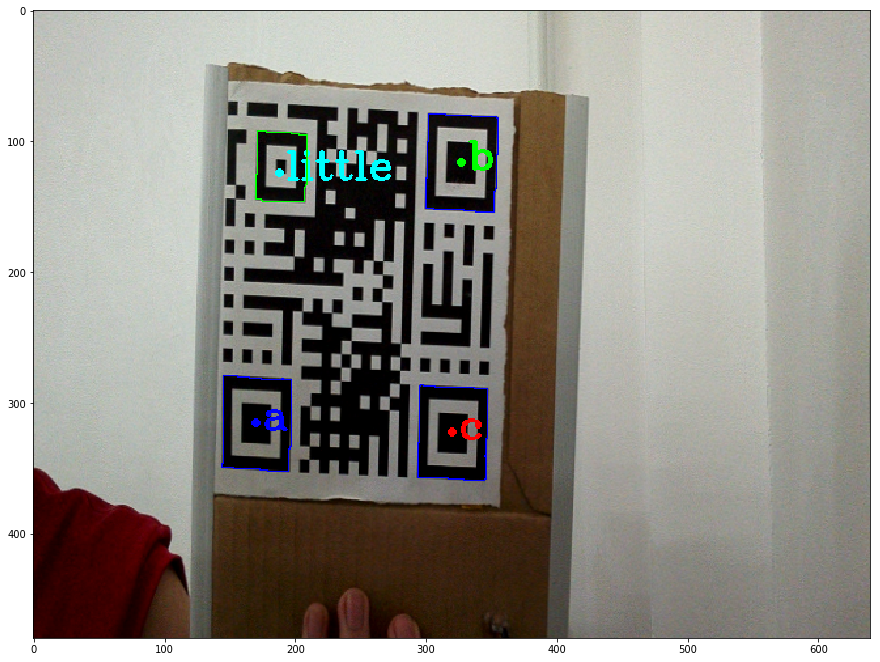

In [48]:
plt.figure(figsize=[15, 15])
plt.imshow(img[:, :, ::-1])

In [88]:
image = img.copy()
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#    th, image_otsu = cv2.threshold(image_gray, 0, 255, cv2.THRESH_OTSU)
image_adapt = cv2.adaptiveThreshold(image_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 41, 5)

# _, contours, hierachy = cv2.findContours(image_adapt, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE, None, None)
_, contours, hierachy = cv2.findContours(image_adapt, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE, None, None)

buff_lis = []
little_buff_lis = []
new_contours = []
for idx, c in enumerate(contours):
    area = cv2.contourArea(c)
    if area < 50:
        continue
    next_id = hierachy[0, idx, -2]
    if next_id == -1:
        continue
    next_area = cv2.contourArea(contours[next_id])
    next_next_id = hierachy[0, next_id, -2]
    if next_next_id == -1:
        continue
    next_next_area = cv2.contourArea(contours[next_next_id])
    if next_next_area < 1:
        continue

    n = np.array([area/25, next_area/16, next_next_area/9], np.float32)
    try:
        if np.sum(np.abs(np.array([n[0]/n[1], n[1]/n[2], n[0]/n[2]])-1)) < 3:
            buff_lis.append(c)
        else:
            n = np.array([area/25, next_area/9, next_next_area/1], np.float32)
            if np.sum(np.abs(np.array([n[0]/n[1], n[1]/n[2], n[0]/n[2]])-1)) < 3:
                little_buff_lis.append(c)
    except:
        print('error', n[0], n[1], n[2])

m = cv2.moments(little_buff_lis[0])
m00 = m['m00']
m01 = m['m01']
m10 = m['m10']
cx = m10/m00
cy = m01/m00
        
image = cv2.drawContours(image, little_buff_lis, -1, (0, 255, 0))

loc = tuple(little_loc[0, :])
# image = cv2.circle(image, tuple([int(x) for x in loc]), 2, (0, 255, 0), 2)

image = cv2.circle(image, (int(cx), int(cy)), 2, (0, 0, 255), 2)

In [90]:
little_loc = np.mean(little_buff_lis[0], axis=0)

In [91]:
little_loc

array([[ 190.05555556,  118.83333333]])

In [ ]:
print(little)

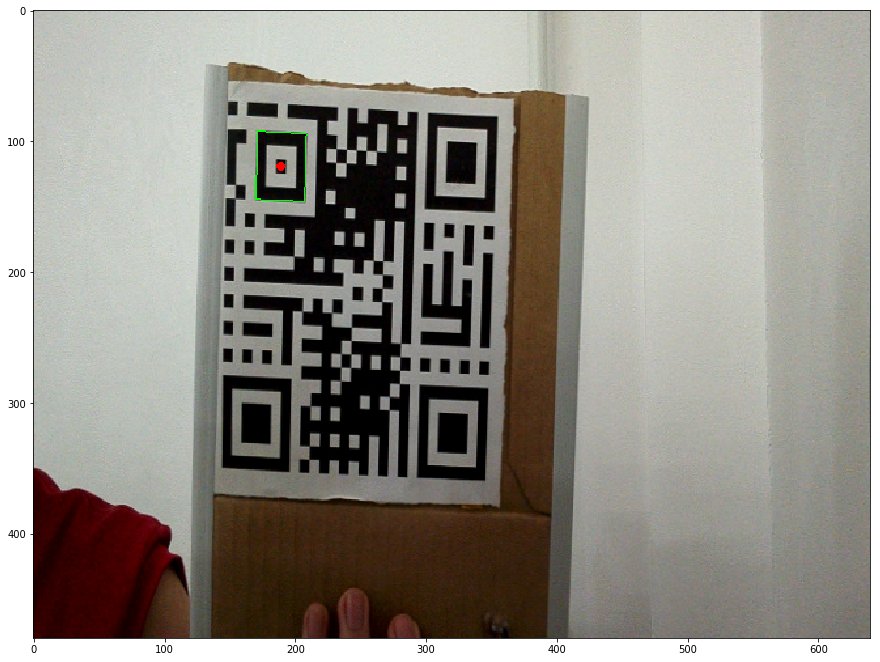

In [89]:
plt.figure(figsize=[15, 15])
plt.imshow(image[:, :, ::-1])